# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

## Track A

Let's first import the main libraries

In [3]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from copy import copy as cp
from sklearn.cluster import MeanShift
from skimage.restoration import denoise_tv_chambolle

c:\Users\mikec\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


and store all the images in 2 lists.

In [2]:
models = []
scenes = []
for i in range(1, 28):
    img_mod = cv2.imread('dataset/models/ref' + str(i) + '.png', 1)
    img_mod = cv2.cvtColor(img_mod, cv2.COLOR_BGR2RGB)
    models.append(img_mod)
for i in range(1, 13):
    img_scene = cv2.imread('dataset/scenes/scene' + str(i) + '.png', 1)
    img_scene = cv2.cvtColor(img_scene, cv2.COLOR_BGR2RGB)
    scenes.append(img_scene)

#### First denoising approach  
Before start detecting the keypoints, we'll try do denoise the scene images by implementing a diagonal lone sorting algorithm.

In [5]:
def denoise_image(image):
    def process_channel(channel):
        # Get the dimensions of the image
        rows, cols = channel.shape
        # Create a copy of the channel to store the denoised result
        denoised_channel = channel.copy()

        # Iterate over the image with a 3x3 window
        for i in range(1, rows - 1):
            for j in range(1, cols - 1):
                # Extract the 3x3 window
                window = channel[i-1:i+2, j-1:j+2]
                # Extract the diagonal elements
                diagonal = [window[0, 0], window[1, 1], window[2, 2]]
                # Sort the diagonal elements
                diagonal_sorted = sorted(diagonal)

                # Check if the diagonal elements are noisy
                if diagonal_sorted[0] == 0 or diagonal_sorted[0] == 255:
                    # Check if there is a non-noisy diagonal element
                    non_noisy_diagonal = [d for d in diagonal if d != 0 and d != 255]
                    if non_noisy_diagonal:
                        denoised_channel[i, j] = non_noisy_diagonal[0]
                    else:
                        # Replace the noisy pixel with a non-noisy 4-neighborhood pixel
                        neighbors = [window[0, 1], window[1, 0], window[1, 2], window[2, 1]]
                        non_noisy_neighbors = [n for n in neighbors if n != 0 and n != 255]
                        if non_noisy_neighbors:
                            denoised_channel[i, j] = non_noisy_neighbors[0]
                        else:
                            denoised_channel[i, j] = diagonal_sorted[1]
                else:
                    denoised_channel[i, j] = diagonal_sorted[1]

        return denoised_channel

    # Split the image into its three channels
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Process each channel
    denoised_red = process_channel(red_channel)
    denoised_green = process_channel(green_channel)
    denoised_blue = process_channel(blue_channel)

    # Merge the channels back into an image
    denoised_image = cv2.merge((denoised_red, denoised_green, denoised_blue))

    return denoised_image

In [14]:
# Apply the denoising pipeline to the denoised_scenes
final_denoised_scenes = [denoise_image(scene) for scene in scenes]

Let's also sharpen these images.

In [15]:
sharpen_filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], np.float32)
sharpened_scenes = []
for scene in final_denoised_scenes:
    scene = cv2.filter2D(scene, -1, sharpen_filter)
    sharpened_scenes.append(scene)

Let's see an example of a scene after applying the denoising algorithm.

In [ ]:
plt.figure(figsize=(10, 18))

# Plot the original scene
plt.subplot(3, 1, 1)
plt.imshow(scenes[2])
plt.title('Original Scene 1')
plt.axis('off')

# Plot the denoised scene
plt.subplot(3, 1, 2)
plt.imshow(final_denoised_scenes[2])
plt.title('Denoised Scene 1')
plt.axis('off')

# Plot the sharpened scene
plt.subplot(3, 1, 3)
plt.imshow(sharpened_scenes[2])
plt.title('Sharpened Scene 1')
plt.axis('off')

plt.show()

#### Second denoising approach  
Alternatively, scenes can be denboised using classical filters.

In [23]:
denoised_scenes = []
for scene in scenes:
    scene = cv2.medianBlur(scene, 5)
    scene = cv2.GaussianBlur(scene, (5, 5) , 1)
    scene = cv2.fastNlMeansDenoisingColored(scene, h=12, hColor=12, templateWindowSize=7, searchWindowSize=21)
    denoised_scenes.append(scene)

# den_scene = cv2.medianBlur(scenes[3], 3)
# den_scene = cv2.medianBlur(den_scene, 3)
# den_scene = cv2.medianBlur(den_scene, 3)
# den_scene = cv2.bilateralFilter(den_scene, d=9, sigmaColor=10, sigmaSpace=50)
# den_scene = cv2.fastNlMeansDenoisingColored(den_scene, h=5, hColor=5, templateWindowSize=7, searchWindowSize=21)

median filter 5x5 +  
GaussianBlur(scene, (5, 5) , 1) +  
fastNlMeansDenoisingColored(scene, h=12, hColor=12, templateWindowSize=7, searchWindowSize=21) +  
sharpening [[0, -1, 0], [-1, 5, -1], [0, -1, 0]] +  
minmatchcount(85,85,85,60,60) +  
0.7 ratio test = 68/70 = 97.14% accuracy...only once got 98.57%

3 median filters 3x3 +  
GaussianBlur(scene, (11, 11) , 1.5) +  
sharpening [[0, -1, 0], [-1, 5, -1], [0, -1, 0]] +  
minmatchcount(85,85,85,60,60) +  
0.7 ratio test = 68/70 = 97.14% accuracy

3 median filters 3x3 +  
GaussianBlur(scene, (11, 11) , 1.5) +  
85 minmatchcount +  
0.7 ratio test = 66/70 = 94.29% accuracy  

3 median filters 3x3 +  
fastNlMeansDenoisingColored(scene, h=3, hColor=3, templateWindowSize=7, searchWindowSize=21)  
GaussianBlur(scene, (11, 11) , 1.5) +  
85 minmatchcount +  
0.7 ratio test = 66/70 = 94.29% accuracy  
  
3 median filters 3x3 +  
85 minmatchcount +  
0.7 ratio test = 65/70 = 92.86% accuracy  

3 median filters 3x3 +  
bilateralFilter(scene, d=9, sigmaColor=50, sigmaSpace=150) +  
85 minmatchcount +  
0.7 ratio test = 64/70 = 91.43% accuracy  

An edge sharpening step is performed after denoising to restore edges' sharpness.

In [24]:
sharpen_filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], np.float32)
sharpened_scenes = []
for scene in denoised_scenes:
    scene = cv2.filter2D(scene, -1, sharpen_filter)
    sharpened_scenes.append(scene)

Let's show a scene after sharpening.

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(sharpened_scenes[2])
plt.title('Sharpened Scene 1')
plt.axis('off')
plt.show()

#### Third denoising approach  
Implementing denoising pipeline from "Salt and Pepper Noise Removal Method Based on the Edge-Adaptive Total Variation Model".


In [4]:
def edge_adaptive_tv_denoise(image, tv_weight=0.1):
    # Step 1: Edge Detection
    edges = cv2.Canny(image, 100, 200)
    edges_dilated = cv2.dilate(edges, None)
    edges_inv = cv2.bitwise_not(edges_dilated)

    # Step 2: Median Filtering on Non-Edge Regions
    median_filtered = cv2.medianBlur(image, 3)
    non_edge_regions = cv2.bitwise_and(median_filtered, median_filtered, mask=edges_inv)

    # Step 3: Total Variation Denoising on Edge Regions
    image_float = image.astype(np.float32) / 255.0
    tv_denoised = denoise_tv_chambolle(image_float, weight=tv_weight)
    tv_denoised_uint8 = (tv_denoised * 255).astype(np.uint8)
    edge_regions = cv2.bitwise_and(tv_denoised_uint8, tv_denoised_uint8, mask=edges_dilated)

    # Step 4: Combine Edge and Non-Edge Regions
    denoised_image = cv2.add(non_edge_regions, edge_regions)

    return denoised_image

# Apply the Edge-Adaptive Total Variation Denoising to all scenes
denoised_scenes_edge_adaptive = [edge_adaptive_tv_denoise(scene, tv_weight=0.1) for scene in scenes]

Let's also sharpen them.

In [13]:
sharpen_filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], np.float32)
sharpened_scenes_edge_adaptive = []
for scene in denoised_scenes_edge_adaptive:
    scene = cv2.filter2D(scene, -1, sharpen_filter)
    sharpened_scenes_edge_adaptive.append(scene)

Let's show an example.

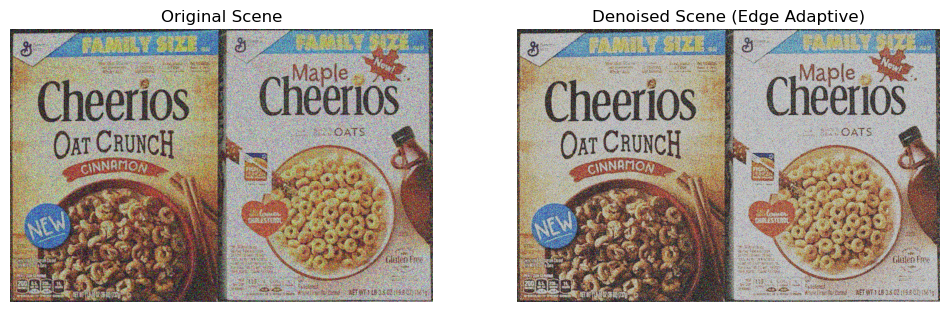

In [14]:
plt.figure(figsize=(12, 6))

# Plot the original scene
plt.subplot(1, 2, 1)
plt.imshow(scenes[0])
plt.title('Original Scene')
plt.axis('off')

# Plot the denoised scene using edge adaptive method
plt.subplot(1, 2, 2)
plt.imshow(sharpened_scenes_edge_adaptive[0])
plt.title('Denoised Scene (Edge Adaptive)')
plt.axis('off')

plt.show()

Let's implement the object detection pipeline.

In [6]:
# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

In [26]:
# Store the keypoints and descriptors for all scenes and models of track A
kp_des_models = []
kp_des_scenes = []
for scene in sharpened_scenes:
    kp_des_scenes.append(sift.detectAndCompute(scene, None))
for model in models:
    kp_des_models.append(sift.detectAndCompute(model, None))

In [19]:
# Store the keypoints and descriptors for all scenes and models of track A
kp_des_models = []
kp_des_scenes = []
for scene in final_denoised_scenes:
    kp_des_scenes.append(sift.detectAndCompute(scene, None))
for model in models:
    kp_des_models.append(sift.detectAndCompute(model, None))

In [16]:
# Store the keypoints and descriptors for all scenes and models of track A
kp_des_models = []
kp_des_scenes = []
for scene in sharpened_scenes_edge_adaptive:
    kp_des_scenes.append(sift.detectAndCompute(scene, None))
for model in models:
    kp_des_models.append(sift.detectAndCompute(model, None))

In [8]:
# Defining index for approximate kdtree algorithm
FLANN_INDEX_KDTREE = 1

# Defining parameters for algorithm
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

# Defining search params.
# checks=50 specifies the number of times the trees in the index should be recursively traversed.
# Higher values gives better precision, but also takes more time
search_params = dict(checks = 100)

# Initializing matcher
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [17]:
def detect_single_instance(scene_idx, model_idx, MIN_MATCH_COUNT):
    # Matching and finding the 2 closest elements for each query descriptor.
        matches = flann.knnMatch(kp_des_models[model_idx][1], kp_des_scenes[scene_idx][1], k=2)
        good = []
        for m,n in matches:
            if m.distance < 0.7*n.distance:
                good.append(m)
        if len(good) >= MIN_MATCH_COUNT:
            # building the corrspondences arrays of good matches
            src_pts = np.float32([kp_des_models[model_idx][0][m.queryIdx].pt for m in good]).reshape(-1,1,2)
            dst_pts = np.float32([kp_des_scenes[scene_idx][0][m.trainIdx].pt for m in good]).reshape(-1,1,2)
            # Using RANSAC to estimate a robust homography.
            # It returns the homography M and a mask for the discarded points
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Mask of discarded point used in visualization
            #matchesMask = mask.ravel().tolist()

            # Corners of the query image
            h,w = models[model_idx].shape[:2]
            pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

            # Projecting the corners into the train image
            dst = cv2.perspectiveTransform(pts,M)

            # Calculate height, and width
            top_left = dst[0][0]
            bottom_right = dst[2][0]
            width = bottom_right[0] - top_left[0]
            height = bottom_right[1] - top_left[1]

            # Calculate the barycenter of matched scene keypoints
            barycenter = np.mean(dst, axis=0)[0]
            # Print height, and width
            print(f"Position: ({round(barycenter[0])}, {round(barycenter[1])}), width: {round(width)}px, height: {round(height)}px")
            # Print the barycenter coordinates
            print(f"")

            # make a copy of the scene image to avoid accumulating polylines
            scene_copy = sharpened_scenes_edge_adaptive[scene_idx].copy()  # sharpened_scenes
            # Close all previous figures
            plt.close('all')

            # Drawing the bounding box
            plt.figure()
            img_scene_p = cv2.polylines(scene_copy,[np.int32(dst)],True,255,3, cv2.LINE_AA)
            plt.imshow(img_scene_p)
            plt.show()

        else:
            print("Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT))
            #matchesMask = None

Position: (412, 539), width: 802px, height: 1048px



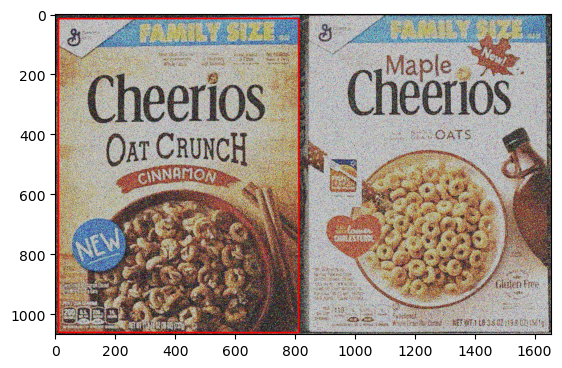

Position: (1248, 533), width: 802px, height: 1048px



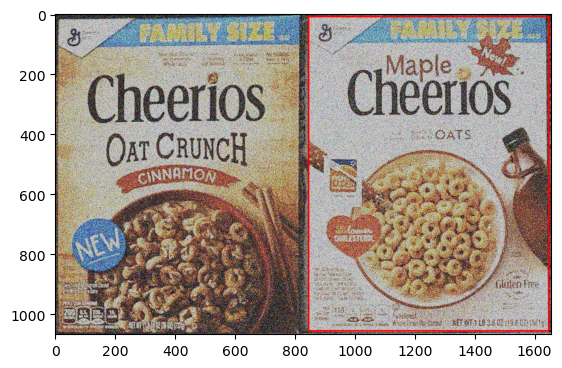

Not enough matches are found - 28/80
Not enough matches are found - 23/80
Not enough matches are found - 59/80
Not enough matches are found - 13/80
Not enough matches are found - 13/80
Not enough matches are found - 20/80
Not enough matches are found - 9/80
Not enough matches are found - 18/80
Not enough matches are found - 7/80
Not enough matches are found - 11/80
Not enough matches are found - 26/80
Not enough matches are found - 52/80
Not enough matches are found - 60/80
Not enough matches are found - 75/80
Position: (306, 494), width: 604px, height: 940px



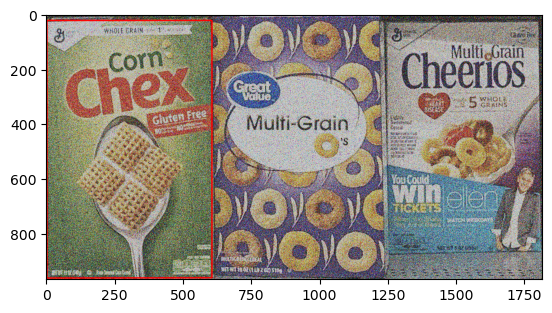

Position: (927, 483), width: 632px, height: 950px



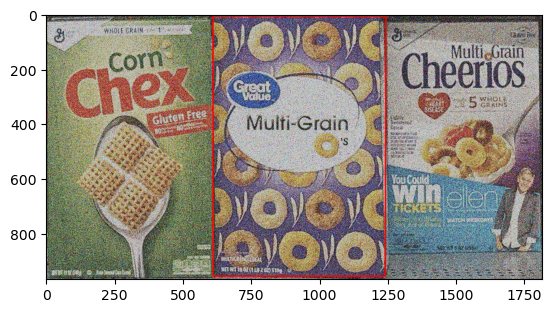

Position: (1527, 451), width: 561px, height: 845px



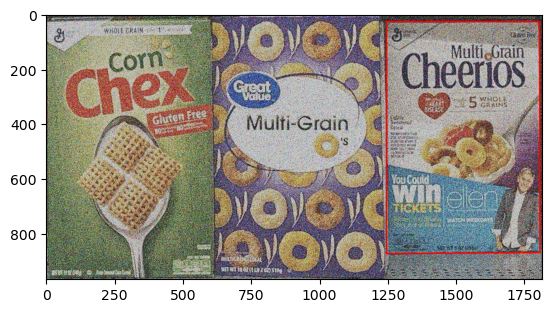

Not enough matches are found - 21/80
Not enough matches are found - 38/80
Not enough matches are found - 65/80
Not enough matches are found - 32/80
Not enough matches are found - 38/80
Not enough matches are found - 7/80
Not enough matches are found - 7/80
Not enough matches are found - 13/80
Not enough matches are found - 46/80
Not enough matches are found - 6/80
Not enough matches are found - 5/80
Not enough matches are found - 47/80
Not enough matches are found - 17/80
Not enough matches are found - 19/80
Position: (300, 459), width: 598px, height: 665px



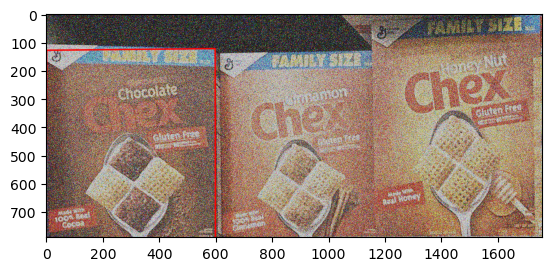

Not enough matches are found - 72/80
Position: (1446, 397), width: 559px, height: 775px



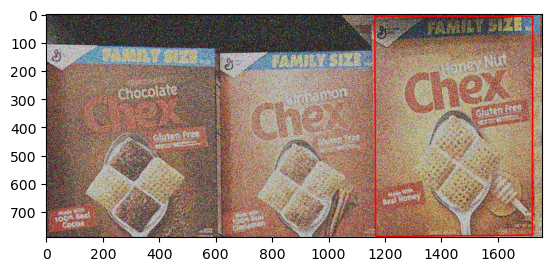

Not enough matches are found - 11/80
Not enough matches are found - 18/80
Not enough matches are found - 2/80
Not enough matches are found - 5/80
Not enough matches are found - 4/80
Not enough matches are found - 9/80
Position: (887, 913), width: 381px, height: 502px



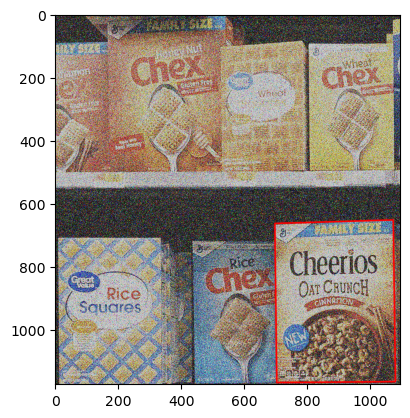

Not enough matches are found - 47/60
Not enough matches are found - 27/60
Not enough matches are found - 18/60
Not enough matches are found - 36/60
Not enough matches are found - 7/60
Not enough matches are found - 11/60
Not enough matches are found - 40/60
Not enough matches are found - 35/60
Not enough matches are found - 24/60
Not enough matches are found - 5/60
Not enough matches are found - 4/60
Not enough matches are found - 10/60
Not enough matches are found - 35/60
Not enough matches are found - 31/60
Not enough matches are found - 41/60
Not enough matches are found - 21/60
Not enough matches are found - 13/60
Not enough matches are found - 31/60
Not enough matches are found - 7/60
Not enough matches are found - 9/60
Not enough matches are found - 22/60
Not enough matches are found - 13/60
Not enough matches are found - 4/60
Position: (368, 753), width: 366px, height: 552px



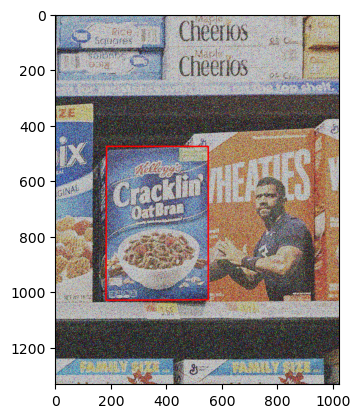

Position: (715, 743), width: 431px, height: 650px



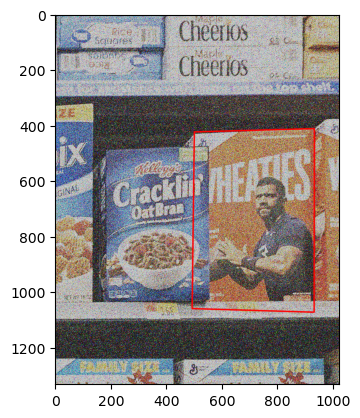

Not enough matches are found - 26/60
Not enough matches are found - 28/60


In [18]:
MIN_MATCH_COUNT_d = {'scene1': 80, 'scene2': 80, 'scene3': 80, 'scene4': 60, 'scene5': 60}

# iterate through the first 5 denoised scenes for track A
for i in range(5):
    MIN_MATCH_COUNT = MIN_MATCH_COUNT_d[f'scene{i+1}']
    # for each of them iterate through the first 14 models
    for j in range(14):
        detect_single_instance(i, j, MIN_MATCH_COUNT)

## Track B

In [10]:
MIN_MATCH_COUNT = 200

for i in range(5, 12):
    #MIN_MATCH_COUNT = MIN_MATCH_COUNT_d[f'scene{i+1}']
    # for each of them iterate through the first 14 models
    for j in range(14, 27):
        detect_multi_instances(i, j, MIN_MATCH_COUNT)

NameError: name 'detect_multi_instances' is not defined

### Template matching

Position: (583, 620), width: 326px, height: 905px



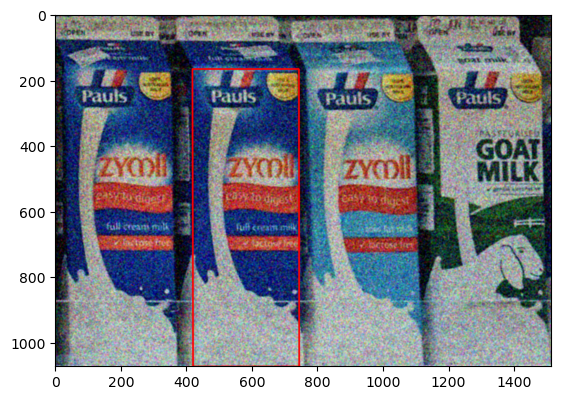

Not enough matches are found - 5/20
Not enough matches are found - 5/20
Not enough matches are found - 0/20
Not enough matches are found - 1/20
Not enough matches are found - 3/20
Not enough matches are found - 8/20
Not enough matches are found - 5/20
Not enough matches are found - 3/20
Not enough matches are found - 8/20
Not enough matches are found - 2/20
Not enough matches are found - 1/20
Not enough matches are found - 0/20
Not enough matches are found - 2/20
Position: (1030, 462), width: 229px, height: 596px



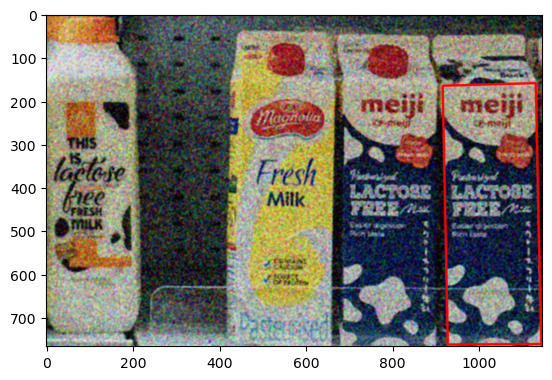

Not enough matches are found - 7/20
Not enough matches are found - 3/20
Not enough matches are found - 1/20
Not enough matches are found - 6/20
Not enough matches are found - 4/20
Not enough matches are found - 3/20
Not enough matches are found - 6/20
Not enough matches are found - 4/20
Not enough matches are found - 1/20
Not enough matches are found - 2/20
Not enough matches are found - 2/20
Not enough matches are found - 1/20
Not enough matches are found - 2/20
Position: (649, 568), width: 324px, height: 853px



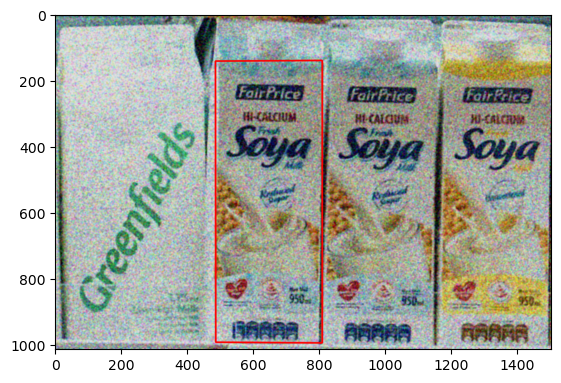

Position: (260, 584), width: 207px, height: 822px



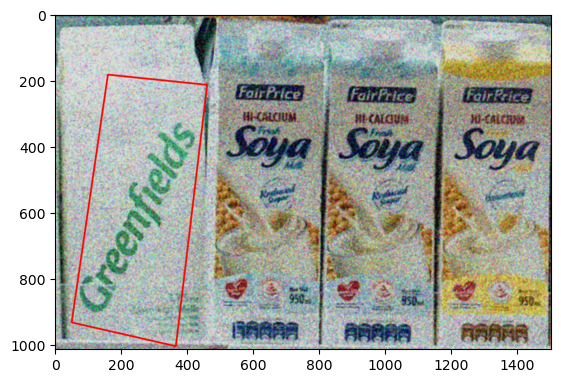

Not enough matches are found - 1/20
Not enough matches are found - 1/20
Not enough matches are found - 3/20
Not enough matches are found - 6/20
Position: (988, 566), width: 323px, height: 869px



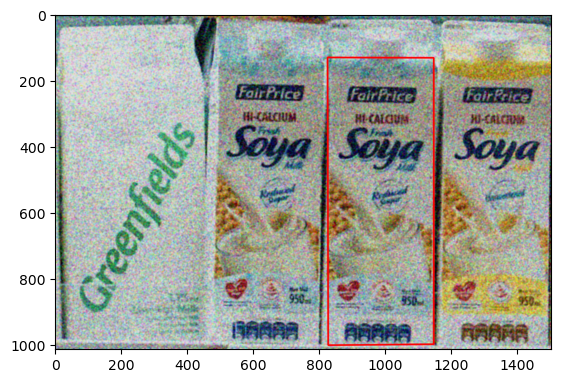

Position: (1338, 580), width: 325px, height: 852px



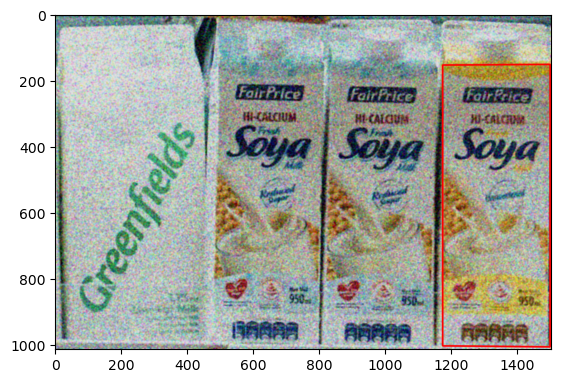

Not enough matches are found - 1/20
Position: (261, 567), width: 208px, height: 819px



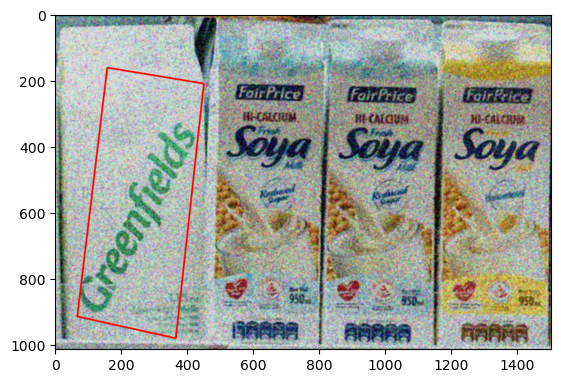

Position: (260, 567), width: 242px, height: 804px



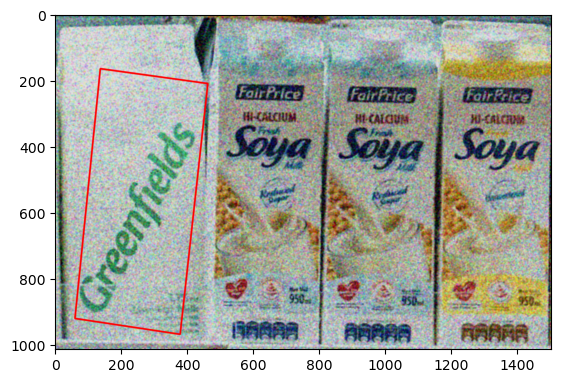

Not enough matches are found - 3/20
Not enough matches are found - 11/20
Not enough matches are found - 2/20
Not enough matches are found - 9/20
Position: (851, 377), width: 219px, height: 555px



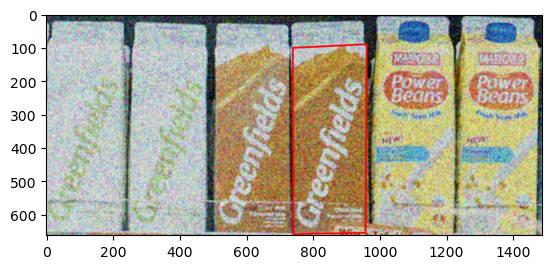

Position: (1105, 373), width: 235px, height: 545px



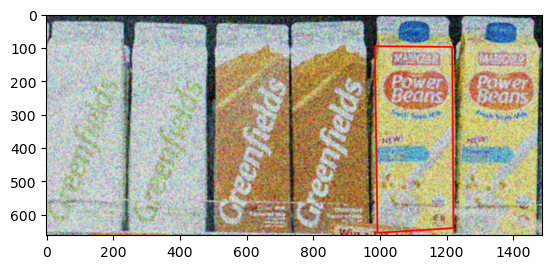

Not enough matches are found - 5/20
Not enough matches are found - 6/20
Not enough matches are found - 0/20
Not enough matches are found - 0/20
Not enough matches are found - 2/20
Not enough matches are found - 12/20
Not enough matches are found - 8/20
Not enough matches are found - 0/20
Not enough matches are found - 1/20
Not enough matches are found - 5/20
Not enough matches are found - 1/20
Not enough matches are found - 0/20
Not enough matches are found - 11/20
Position: (976, 543), width: 254px, height: 694px



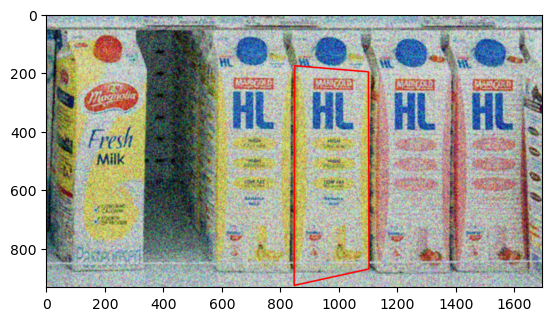

Position: (1261, 538), width: 248px, height: 702px



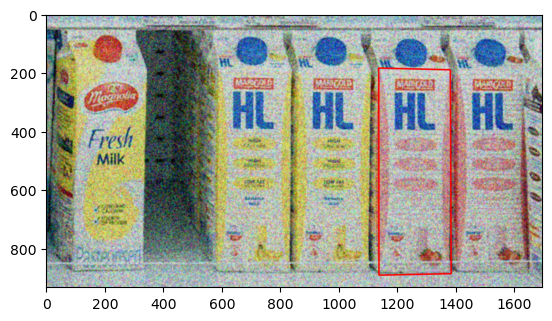

Not enough matches are found - 2/20
Not enough matches are found - 0/20
Not enough matches are found - 0/20
Not enough matches are found - 4/20
Not enough matches are found - 1/20
Not enough matches are found - 0/20
Not enough matches are found - 2/20
Position: (167, 361), width: 184px, height: 484px



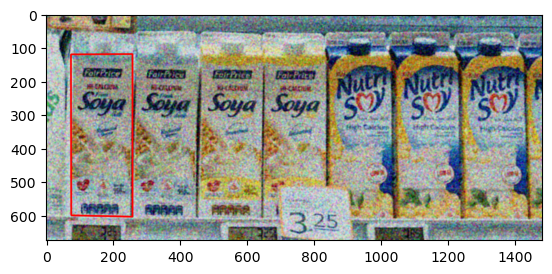

Not enough matches are found - 1/20
Not enough matches are found - 0/20
Not enough matches are found - 1/20
Not enough matches are found - 1/20
Not enough matches are found - 2/20
Position: (358, 361), width: 182px, height: 489px



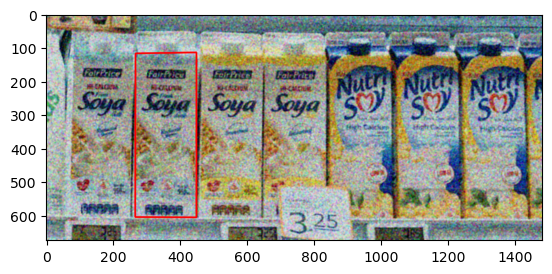

Position: (553, 368), width: 182px, height: 480px



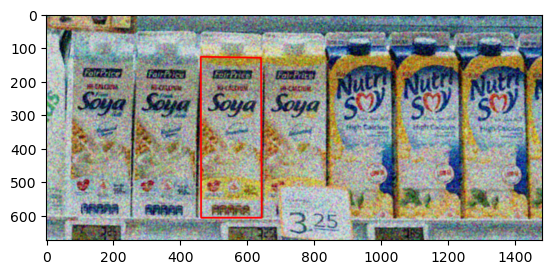

Position: (1144, 371), width: 185px, height: 481px



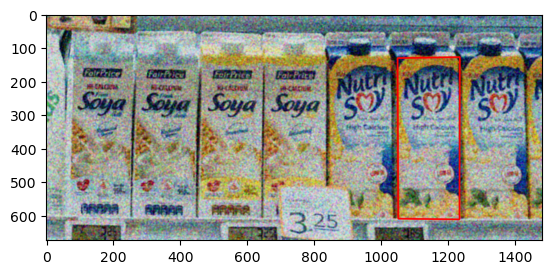

Not enough matches are found - 1/20
Not enough matches are found - 0/20
Not enough matches are found - 2/20
Not enough matches are found - 6/20
Not enough matches are found - 3/20
Position: (410, 406), width: 224px, height: 585px



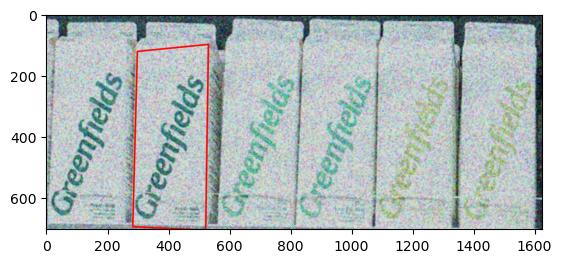

Not enough matches are found - 4/20
Not enough matches are found - 0/20
Not enough matches are found - 4/20
Not enough matches are found - 2/20
Not enough matches are found - 0/20
Not enough matches are found - 1/20
Not enough matches are found - 0/20
Position: (411, 401), width: 222px, height: 580px



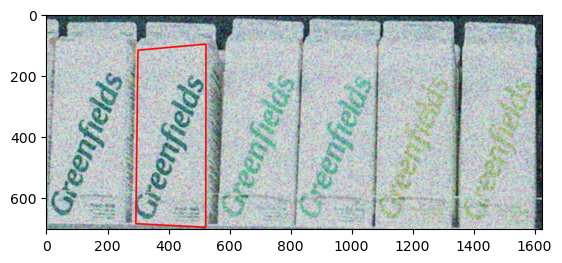

Position: (399, 382), width: 284px, height: 594px



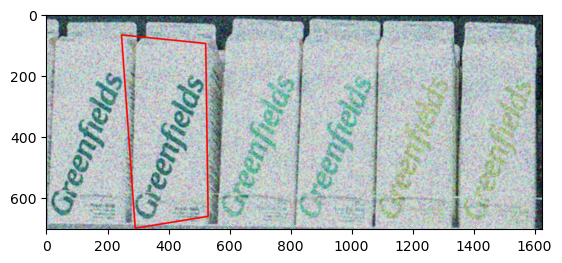

In [49]:
MIN_MATCH_COUNT = 20
for i in range(5, 12):
    for j in range(14, 27):
        detect_single_instance(i, j, MIN_MATCH_COUNT)

error: OpenCV(4.10.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'cv::matchTemplate'


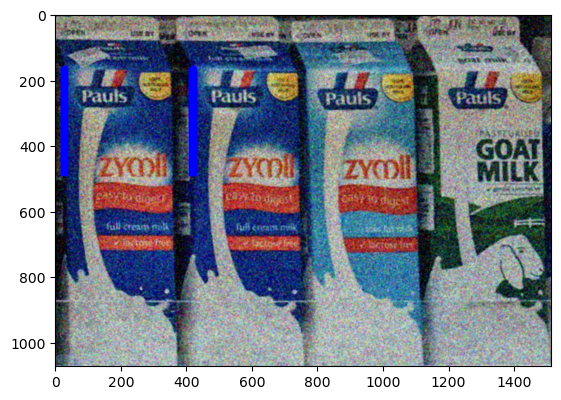

In [12]:
for i in range(5, 12):
    for j in range(14, 27):
        scene = sharpened_scenes[i].copy()
        template = models[j]
        w, h, _ = template.shape[::-1]
        # Apply template Matching
        res = cv2.matchTemplate(scene, template, cv2.TM_CCOEFF_NORMED)
        threshold = 0.8
        loc = np.where(res >= threshold)
        for pt in zip(*loc[::-1]):
            cv2.rectangle(scene, pt, (pt[0] + w, pt[1] + h), (0,0,255), 1)
        plt.figure()
        plt.imshow(scene)
